In [1]:
## Inspect Environment
## RAM
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('To enable a high-RAM runtime, select the Runtime > "Change runtime type"')
  print('menu, and then select High-RAM in the Runtime shape dropdown. Then, ')
  print('re-execute this cell.')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 68.7 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
!pip install librosa
!pip install pydub # for TF Dataset loading

In [2]:
import os
import time
import sys
import pdb
from sklearn.model_selection import train_test_split
import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_probability as tfp
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import PIL
from PIL import Image

In [3]:
# Librosa (the mother of audio files)
import librosa
import librosa.display
import IPython.display as ipd

In [4]:
print(tf.__version__)

2.7.0


## Load Data (From TF DataSet)

In [ ]:
gtzan_data = tfds.load('gtzan') # 'Train'

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/gtzan/1.0.0.incompleteEVFN9J/gtzan-train.tfrecord


  0%|          | 0/1000 [00:00<?, ? examples/s]

Dataset gtzan downloaded and prepared to /root/tensorflow_datasets/gtzan/1.0.0. Subsequent calls will reuse this data.


In [ ]:
data = gtzan_data['train']

In [ ]:
# gtzan_df = pd.DataFrame(gtzan_data)
# gtzan_df.head()
tfds.as_dataframe(gtzan_data['train'].take(5))

,audio,audio/filename,label
0,[-8821 -8083 -6088 ... 417 -98 -489],b'pop.00038.wav',7
1,[-170 -237 -81 ... 412 -27 -365],b'classical.00013.wav',1
2,[-3789 -1596 -925 ... -612 -781 -287],b'metal.00093.wav',6
3,[-3236 -2939 -343 ... 2453 3239 2091],b'rock.00074.wav',9
4,[ -353 -656 -795 ... -3446 -3623 -3008],b'classical.00004.wav',1


In [ ]:
for sample in data.take(2):
  print(type(sample))
  audio_tensor = sample['audio']
  print(audio_tensor)
  ## Audio Display
  ipd.Audio(audio_tensor.numpy(), rate=3000)

<class 'dict'>
tf.Tensor([-8821 -8083 -6088 ...   417   -98  -489], shape=(661504,), dtype=int64)
<class 'dict'>
tf.Tensor([-170 -237  -81 ...  412  -27 -365], shape=(661794,), dtype=int64)


In [ ]:
data_list = list(data.as_numpy_iterator())

In [ ]:
[a['audio/filename'] for a in data_list[:10]]

[b'pop.00038.wav',
 b'classical.00013.wav',
 b'metal.00093.wav',
 b'rock.00074.wav',
 b'classical.00004.wav',
 b'classical.00009.wav',
 b'country.00089.wav',
 b'rock.00063.wav',
 b'metal.00012.wav',
 b'hiphop.00076.wav']

In [ ]:
sample = data_list[9]
print(sample['audio/filename'])
ipd.Audio(sample['audio'], rate=22050)

b'hiphop.00076.wav'


### Load Image Data (The Image pixel value is already scaled to [0, 255])

In [ ]:
GENRES = {'metal': 0, 'disco': 1, 'classical': 2, 'rock': 3, 'jazz': 4, 
          'country': 5, 'pop': 6, 'blues': 7, 'reggae': 8, 'hiphop': 9}

IMG_DATA_PATH = "GENERATIVE_DATA/GTZAN/images_original/"

Loading Audio Img files under Genere: metal
Image Shape: (288, 432, 4)
255 0 168.04744767554013 255.0
Loading Audio Img files under Genere: disco
Image Shape: (288, 432, 4)
255 0 156.12368184156378 255.0
Loading Audio Img files under Genere: classical
Image Shape: (288, 432, 4)
255 0 153.1373376414609 255.0
Loading Audio Img files under Genere: rock
Image Shape: (288, 432, 4)
255 0 156.76382056970164 255.0
Loading Audio Img files under Genere: jazz
Image Shape: (288, 432, 4)
255 0 150.52416489840536 255.0
Loading Audio Img files under Genere: country
Image Shape: (288, 432, 4)
255 0 163.78601023984052 255.0
Loading Audio Img files under Genere: pop
Image Shape: (288, 432, 4)
255 0 150.29815498006687 255.0
Loading Audio Img files under Genere: blues
Image Shape: (288, 432, 4)
255 0 153.26798804012347 255.0
Loading Audio Img files under Genere: reggae
Image Shape: (288, 432, 4)
255 0 155.36055049189815 255.0
Loading Audio Img files under Genere: hiphop
Image Shape: (288, 432, 4)
255 0 16

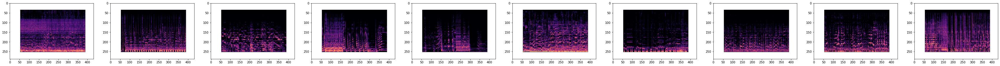

In [ ]:
i = 1
fig = plt.figure(figsize=(60, 24))
img_arrs = []
for genere, _ in GENRES.items():
  folder = IMG_DATA_PATH + genere
  print(f"Loading Audio Img files under Genere: {genere}")
  for root, subdirs, files in os.walk(folder):
    for file in files[:1]:
      file_name = folder + "/" + file
      # print(f"fileName: {file_name}")

      # print("Loading Img...")
      img = Image.open(file_name)
      img_arr = np.array(img)
      print(f"Image Shape: {img_arr.shape}")
      print(np.amax(img_arr), np.amin(img_arr), np.mean(img_arr), np.median(img_arr))
      plt.subplot(1, 10, i)
      i = i+1
      plt.imshow(img_arr)

      img_arrs.append(img_arr)
      
plt.show()

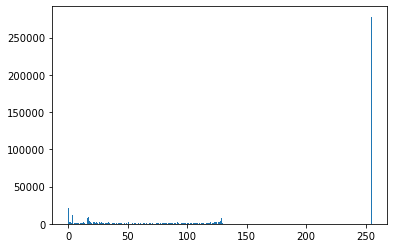

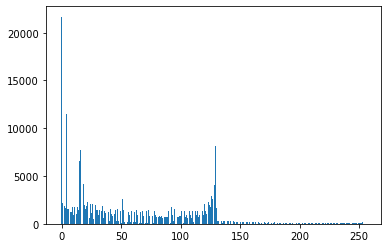

In [ ]:
# print(np.transpose(img_arrs[0], (2, 0, 1))) # HWC -> CHW
digit_unique, digit_unique_cnt = np.unique(img_arrs[0], return_counts=True)
plt.bar(digit_unique, digit_unique_cnt)
plt.show()

import copy
cut_mode_cnt = copy.copy(digit_unique_cnt)
cut_mode_cnt[np.where(digit_unique==255)[0][0]] = 0.0
plt.bar(digit_unique, cut_mode_cnt)
plt.show()

## Load Data (From Local)

In [5]:
data_path = "GENERATIVE_DATA/GTZAN/genres_original/"

In [6]:
# DEV Test Loading file
sample, sample_rate = librosa.load(data_path+'hiphop/hiphop.00072.wav')
print("Sample Signal Shape: {}, sample Rate: {}".format(sample.shape, sample_rate))
ipd.Audio(sample, rate=22050)

Sample Signal Shape: (661794,), sample Rate: 22050


In [8]:
print(sample)
print(np.amax(sample), np.amin(sample))

[-0.16305542 -0.17230225 -0.16052246 ...  0.03668213 -0.01269531
 -0.04077148]
0.9874573 -0.9874878


Time Series:  [-1.         -0.97979798 -0.95959596 -0.93939394 -0.91919192 -0.8989899
 -0.87878788 -0.85858586 -0.83838384 -0.81818182 -0.7979798  -0.77777778
 -0.75757576 -0.73737374 -0.71717172 -0.6969697  -0.67676768 -0.65656566
 -0.63636364 -0.61616162 -0.5959596  -0.57575758 -0.55555556 -0.53535354
 -0.51515152 -0.49494949 -0.47474747 -0.45454545 -0.43434343 -0.41414141
 -0.39393939 -0.37373737 -0.35353535 -0.33333333 -0.31313131 -0.29292929
 -0.27272727 -0.25252525 -0.23232323 -0.21212121 -0.19191919 -0.17171717
 -0.15151515 -0.13131313 -0.11111111 -0.09090909 -0.07070707 -0.05050505
 -0.03030303 -0.01010101  0.01010101  0.03030303  0.05050505  0.07070707
  0.09090909  0.11111111  0.13131313  0.15151515  0.17171717  0.19191919
  0.21212121  0.23232323  0.25252525  0.27272727  0.29292929  0.31313131
  0.33333333  0.35353535  0.37373737  0.39393939  0.41414141  0.43434343
  0.45454545  0.47474747  0.49494949  0.51515152  0.53535354  0.55555556
  0.57575758  0.5959596   0.61616162  

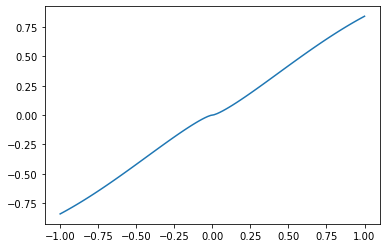

In [36]:
## Sound Wave
RATE = 22050 # sample rate
T = 5.0    # seconds
t = np.linspace(-1, 1, 100, endpoint=True) # time variable
print("Time Series: ",t)
wave = np.sin(t)# pure sine wave at 220 Hz
mu_law = np.sin(t) * np.log(1 + 255*np.abs(t))/np.log(1+255)
print(mu_law)

plt.plot(t, mu_law)
# plt.plot(t, wave)
plt.show()

In [19]:
np.pi/2
np.log(np.e)

1.0

#### Samples Reproduce

In [ ]:
"""
@description: Method to split a song into multiple songs using overlapping windows
"""
def splitsongs(X, y, window = 0.05, overlap = 0.5):
    # Empty lists to hold our results
    temp_X = []
    temp_y = []

    # Get the input song array size
    xshape = X.shape[0] # signal length
    chunk = int(xshape*window)
    offset = int(chunk*(1.-overlap))
    
    # Split the song and create new ones on windows
    spsong = [X[i:i+chunk] for i in range(0, xshape - chunk + offset, offset)]
    for s in spsong:
        # ignore the boundaries
        if s.shape[0] != chunk:
            continue

        temp_X.append(s)
        temp_y.append(y)

    return np.array(temp_X), np.array(temp_y)

[(66179,), (66179,), (66179,), (66179,), (66179,), (66179,), (66179,), (66179,), (66179,), (66179,), (66179,), (66179,), (66179,), (66179,), (66179,), (66179,), (66179,), (66179,), (66179,)]
(19,)
[-0.16305542 -0.17230225 -0.16052246 ... -0.12588501 -0.12197876
 -0.14181519]


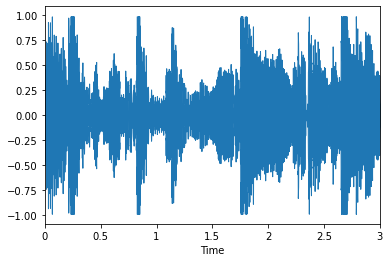

In [ ]:
## DEV
(sample_splits, sample_y_splits) = splitsongs(sample, 'hiphop', window=0.1) # break into 3s interval
print([s.shape for s in sample_splits])
print(sample_y_splits.shape)
print(sample_splits[0])
librosa.display.waveplot(sample_splits[0])

In [ ]:
ipd.Audio(sample_splits[0], rate=sample_rate)

#### Convertsion to Spectragram (frequence heat map over time series)

In [ ]:
"""
@description: Method to convert a list of songs to a np array of melspectrograms
@param hop_length: # samples between time frames; decide the dimension of 1-axis/time-axis length
"""
def to_melspectrogram(songs, n_fft=1024, hop_length=256):
    # Transformation function

    # add an axis to input sets
    # Adding Channel dimension; e.g. (28, 28) -> (28, 28, 1)
    melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
        hop_length=hop_length, n_mels=128)[:,:,np.newaxis]

    # map transformation of input songs to melspectrogram using log-scale
    tsongs = map(melspec, songs)
    # np.array([librosa.power_to_db(s, ref=np.max) for s in list(tsongs)])
    return np.array(list(tsongs))

In [ ]:
sample_mel_specs = to_melspectrogram(sample_splits, hop_length=512, n_fft=2048)
print(sample_mel_specs.shape)

(19, 128, 130, 1)


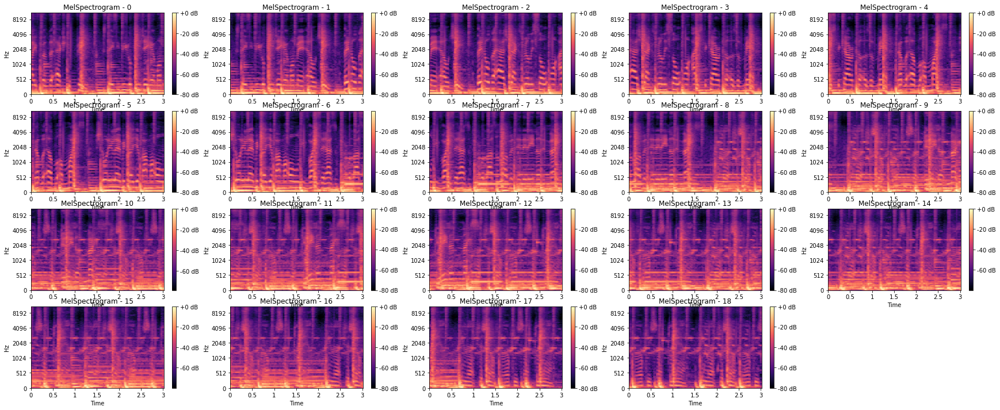

In [ ]:
fig = plt.figure(figsize=(30, 12))

for i in range(sample_mel_specs.shape[0]):
  mel_spec_dB = librosa.power_to_db(sample_mel_specs[i].squeeze(), ref=np.max)
  plt.subplot(4, 5, i + 1)
  # plt.figure(figsize=(6, 3))
  librosa.display.specshow(mel_spec_dB, x_axis='time', y_axis='mel', sr=sample_rate)
  plt.colorbar(format='%+1.0f dB')
  plt.title(f"MelSpectrogram - {i}")
  # plt.tight_layout()
  
plt.show()

#### Spectragram to Signal

In [ ]:

def mel_to_audio(mel_spec, sample_rate=22050):
  sample_signal_inverse = librosa.feature.inverse.mel_to_audio(mel_spec, hop_length=512)
  return sample_signal_inverse

In [ ]:
  ipd.Audio(mel_to_audio(sample_mel_specs[0].squeeze()), rate=sample_rate)

## Data Preprocessing

In [ ]:
''' 
  1. Split each single 30s song sample into smaller segment
  2. convert each segment to melspectrogram
'''
def split_convert(X, y, max_signal_len=660000):
    arr_specs, arr_genres = [], []
    
    # Convert to spectrograms and split into small windows
    for fn, genre in zip(X, y):
        # for debug
        print(f"Loading audio file: {fn}...")

        signal, sr = librosa.load(fn)
        # to avoid inconsistent image/spectragram size
        signal = signal[:max_signal_len]

        # Convert to dataset of spectograms/melspectograms
        signals, y = splitsongs(signal, genre, window=0.1)

        # Convert to "spec" representation
        specs = to_melspectrogram(signals, hop_length=512, n_fft=2048)

        # Save files
        ## attach the forked list of sample segments
        arr_genres.extend(y)
        arr_specs.extend(specs)
    
    return np.array(arr_specs), np.array(arr_genres)

'''
 Generate data-set based on file_path for each audio sample
- then preprocess and convert each sample accordingly
'''
def read_data(src_dir, genres, max_signal_len=660000):    
    # Empty array of dicts with the processed features from all files
    arr_fn = []
    arr_genres = []

    # Get file list from the folders
    for x,_ in genres.items():
        folder = src_dir + x
        print(f"Loading Audio files under Genere: {x}")
        for root, subdirs, files in os.walk(folder):
            for file in files:
                file_name = folder + "/" + file

                ### TODO: some samples just don't load...
                if file_name.find('jazz/jazz.00054.wav') != -1:
                  print(f"Skipping file: {file_name}...")
                  continue

                # Save the file name and the genre
                arr_fn.append(file_name)
                # attach the label
                arr_genres.append(genres[x])
    
    # Split into train and test
    X_train, X_test, y_train, y_test = train_test_split(
        arr_fn, arr_genres, test_size=0.2, random_state=42, stratify=arr_genres #data is split in a stratified fashion under genre label
    )
    
    # Split into small segments and convert to spectrogram
    ## TODO: map this to TF DataSet process
    print("Loading and Preprocessing Training data......")
    X_train, y_train = split_convert(X_train, y_train, max_signal_len=max_signal_len)
    print("Loading and Preprocessing Testing data......")
    X_test, y_test = split_convert(X_test, y_test, max_signal_len=max_signal_len)

    return X_train, y_train, X_test, y_test

In [ ]:
## Data Loading
MAX_SIGNAL_LEN = 660000
genres = {'metal': 0, 'disco': 1, 'classical': 2, 'rock': 3, 'jazz': 4, 
          'country': 5, 'pop': 6, 'blues': 7, 'reggae': 8, 'hiphop': 9}

# Read the data
X_train, y_train, X_test, y_test = read_data(data_path, genres, max_signal_len=MAX_SIGNAL_LEN)

Loading Audio files under Genere: metal
Loading Audio files under Genere: disco
Loading Audio files under Genere: classical
Loading Audio files under Genere: rock
Loading Audio files under Genere: jazz
Skipping file: GENERATIVE_DATA/GTZAN/genres_original/jazz/jazz.00054.wav...
Loading Audio files under Genere: country
Loading Audio files under Genere: pop
Loading Audio files under Genere: blues
Loading Audio files under Genere: reggae
Loading Audio files under Genere: hiphop
Loading and Preprocessing Training data......
Loading audio file: GENERATIVE_DATA/GTZAN/genres_original/country/country.00060.wav...
Loading audio file: GENERATIVE_DATA/GTZAN/genres_original/classical/classical.00008.wav...
Loading audio file: GENERATIVE_DATA/GTZAN/genres_original/hiphop/hiphop.00070.wav...
Loading audio file: GENERATIVE_DATA/GTZAN/genres_original/country/country.00068.wav...
Loading audio file: GENERATIVE_DATA/GTZAN/genres_original/country/country.00049.wav...
Loading audio file: GENERATIVE_DATA/G

In [ ]:
idx_to_genres = {v:k for (k, v) in genres.items()}
idx_to_genres

{0: 'metal',
 1: 'disco',
 2: 'classical',
 3: 'rock',
 4: 'jazz',
 5: 'country',
 6: 'pop',
 7: 'blues',
 8: 'reggae',
 9: 'hiphop'}

In [ ]:
# print(type(X_train), len(X_train), len(X_test))
print(type(X_train), X_train.shape, X_test.shape, y_train.shape, X_test.shape)

print(y_train[:5])
print(set(y_train), set(y_test))

<class 'numpy.ndarray'> (15181, 128, 129, 1) (3800, 128, 129, 1) (15181,) (3800, 128, 129, 1)
[5 5 5 5 5]
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9} {0, 1, 2, 3, 4, 5, 6, 7, 8, 9}


In [ ]:
## Debug Inspect samples
hiphop_idx = np.where(y_train==9)[0]
print(hiphop_idx)
ipd.Audio(mel_to_audio(X_train[hiphop_idx[2]].squeeze()), rate=sample_rate)

[   38    39    40 ... 15121 15122 15123]


###### Data Normalization

In [ ]:
## dev
def debug_np_max():
  # pdb.set_trace()
  a = np.arange(8).reshape((4,2, 1))
  print(a.squeeze())
  print(np.amax(a, axis=-1))
  print(np.amax(a, axis=1))

  b = np.array([[3 , 4, 5, 1],
                 [4, 8, 1, 2],
                 [2, 3, 9, 5]]).reshape((3,2,2))
  print(b)
  print(np.amax(b))
  print("Max\n", np.amax(b, axis=0))

  # for [0,0]: mu = 3+4+2/3 = 3 var=0 + 1 + 1/3 = 0.666
  #[0,1]: mu = 15/3 = 5 var - (1 + 9 + 4)/3 = 4.667
  print("VAR\n", np.var(b, axis=0))



debug_np_max()


[[0 1]
 [2 3]
 [4 5]
 [6 7]]
[[0 1]
 [2 3]
 [4 5]
 [6 7]]
[[1]
 [3]
 [5]
 [7]]
[[[3 4]
  [5 1]]

 [[4 8]
  [1 2]]

 [[2 3]
  [9 5]]]
9
Max
 [[4 8]
 [9 5]]
VAR
 [[ 0.66666667  4.66666667]
 [10.66666667  2.88888889]]


In [ ]:
MAX_SPEC = max(np.amax(X_train), np.amax(X_test))
MIN_SPEC = min(np.amin(X_train), np.amin(X_test))
print(MAX_SPEC, MIN_SPEC)
TRAIN_VAR_0 = np.var(X_train, axis=0)
print(TRAIN_VAR_0.shape)

11115.553 0.0
(128, 129, 1)


In [ ]:
MAX_SPEC_0 = np.amax(X_train, axis=0)
MIN_SPEC_0 = np.amin(X_train, axis=0)
# max_0_ = np.amax(X_train.squeeze(axis=-1), axis=0)
print(MAX_SPEC_0.squeeze(), MAX_SPEC_0.shape)
print(MIN_SPEC_0.squeeze(), MIN_SPEC_0.shape)
# print(max_0_, max_0_.shape)
# print(np.max(max_0))

[[ 3296.5435    1726.084     2890.6577   ...  2993.6812    2808.712
   3369.1821  ]
 [11115.553     7375.4727    6478.0117   ...  8957.713     8026.505
   7053.782   ]
 [ 8680.193     6690.0547   10014.32     ...  9955.908     5849.091
   6141.302   ]
 ...
 [   22.803198    23.101692    14.232733 ...    33.405197    31.033237
     20.46878 ]
 [   35.11203     28.102211    14.79841  ...    19.666965    21.495777
     26.241714]
 [   23.42558     15.637669    14.986044 ...    15.267229    25.827087
     30.082165]] (128, 129, 1)
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  1.2717363e-06 4.4971684e-06]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  1.4325254e-06 3.2112250e-05]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  1.1183956e-06 2.4899537e-05]
 ...
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  3.7522768e-10 3.0334724e-09]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  1.4647203e-10 2.4219333e-0

In [ ]:
# (X_train - min_0)/(max_0 - min_0)

In [ ]:
# Take Raw input
# X_train_scaled = X_train
# X_test_scaled = X_test
# Scale by a uniform constant
# X_train_scaled = X_train / MAX_SPEC
# X_test_scaled = X_test / MAX_SPEC
# Scale digit wise under H x T
X_train_scaled = (X_train - MIN_SPEC_0)/(MAX_SPEC_0 - MIN_SPEC_0)
X_test_scaled = (X_test - MIN_SPEC_0)/(MAX_SPEC_0 - MIN_SPEC_0)

In [ ]:
print(X_train_scaled[0].squeeze())
print(np.amin(X_train_scaled), np.amax(X_train_scaled))
print(np.amin(X_test_scaled), np.amax(X_test_scaled))
# print(np.amin(X_train_scaled, axis=0), np.amax(X_train_scaled, axis=0))

[[8.30012606e-04 4.43456142e-04 3.47039349e-05 ... 1.56297311e-02
  1.59365237e-02 1.28855035e-02]
 [9.20193095e-04 4.91960032e-04 2.25775046e-04 ... 1.18422713e-02
  1.18665053e-02 1.24960337e-02]
 [1.00898808e-02 1.10799652e-02 7.16951070e-03 ... 1.78691205e-02
  2.98796464e-02 2.86377463e-02]
 ...
 [9.22973322e-06 2.27893020e-06 1.87947213e-09 ... 1.78798532e-09
  2.29257724e-09 1.31424883e-06]
 [5.71266310e-06 1.78459447e-06 4.34702857e-10 ... 6.42109255e-10
  6.29843511e-10 1.04982144e-06]
 [8.22205402e-06 3.07931714e-06 2.82911000e-10 ... 3.17081389e-10
  2.48551790e-10 9.19081458e-07]]
0.0 1.0
-2.9962435e-09 18.349169


## CONSTANT DEF

In [ ]:
BATCH_SIZE = 32
TRAIN_SHUFFLE_SIZE = 16000
NUM_GENERES = len(np.unique(y_train))

EPOCHS = 10
# set the dimensionality of the latent space to a plane for visualization later
LATENT_DIM = 2

In [ ]:
## Load to TF DataSet (numpy to TF Tensor)
# train_dataset = (tf.data.Dataset.from_tensor_slices((X_train, y_train))
#                  .shuffle(TRAIN_SHUFFLE_SIZE)
#                  .batch(BATCH_SIZE))
# test_dataset = (tf.data.Dataset.from_tensor_slices((X_test, y_test))
#                  .batch(BATCH_SIZE))

train_dataset = (tf.data.Dataset.from_tensor_slices((X_train_scaled, y_train))
                 .shuffle(TRAIN_SHUFFLE_SIZE)
                 .batch(BATCH_SIZE))
test_dataset = (tf.data.Dataset.from_tensor_slices((X_test_scaled, y_test))
                 .batch(BATCH_SIZE))

In [ ]:
## Debug
test_batch = next(iter(train_dataset))
print(len(test_batch))
print(test_batch[0].shape, test_batch[1].shape)
print(test_batch[1])

hiphop_idx = np.where(test_batch[1]==9)[0]
print(hiphop_idx)
audio = test_batch[0][hiphop_idx[0]].numpy()
print(audio.squeeze(), audio.shape)
ipd.Audio(mel_to_audio(audio.squeeze() * MAX_SPEC), rate=sample_rate)

2
(32, 128, 129, 1) (32,)
tf.Tensor([9 0 5 3 2 7 9 9 7 8 7 7 0 2 4 0 8 7 9 9 7 1 9 5 0 5 4 7 1 0 7 0], shape=(32,), dtype=int32)
[ 0  6  7 18 19 22]
[[1.64605051e-01 1.15204580e-01 2.86427047e-02 ... 1.32259041e-01
  9.45894867e-02 1.02562569e-01]
 [1.02258734e-01 2.00773582e-01 2.32903346e-01 ... 2.30780900e-01
  1.97128028e-01 1.93112731e-01]
 [3.82260382e-02 4.96857055e-02 3.02274711e-02 ... 4.11300994e-02
  5.58018275e-02 4.15795445e-02]
 ...
 [1.50220047e-04 1.59399729e-04 1.33067617e-04 ... 1.00580906e-03
  2.83198734e-03 4.61718673e-03]
 [4.59615767e-05 5.39241191e-05 6.53610477e-05 ... 1.23261462e-03
  3.14226397e-03 2.95456429e-03]
 [6.41102961e-05 1.21120000e-04 1.04607665e-04 ... 1.31489383e-03
  1.65373425e-03 1.50614313e-03]] (128, 129, 1)


In [ ]:
## Scale back
audio_scaled = (audio * (MAX_SPEC_0- MIN_SPEC_0) + MIN_SPEC_0)
ipd.Audio(mel_to_audio(audio_scaled.squeeze()), rate=sample_rate)

In [ ]:
## Just Scaled ..
ipd.Audio(mel_to_audio(audio.squeeze()), rate=sample_rate)

In [ ]:
## Debug: value of Mel Spectragram
tf.reduce_min(test_batch[0])

<tf.Tensor: shape=(), dtype=float32, numpy=2.1173005e-13>

#### A group of test data set (3 x 3) for validation/performance inspeculation

In [ ]:
# create a dict of each unique entry and the associated indices
generes_test_idx = {v: np.where(y_test == v)[0].tolist()[:6] for v in np.unique(y_test)}

print(generes_test_idx)

val_samples = []

for i in range(NUM_GENERES):
  val_samples.append(X_test_scaled[int(generes_test_idx[i][0])])

# Numpy Array
val_samples = np.stack(val_samples, axis=0)

{0: [19, 20, 21, 22, 23, 24], 1: [0, 1, 2, 3, 4, 5], 2: [95, 96, 97, 98, 99, 100], 3: [285, 286, 287, 288, 289, 290], 4: [152, 153, 154, 155, 156, 157], 5: [57, 58, 59, 60, 61, 62], 6: [38, 39, 40, 41, 42, 43], 7: [494, 495, 496, 497, 498, 499], 8: [228, 229, 230, 231, 232, 233], 9: [114, 115, 116, 117, 118, 119]}


In [ ]:
val_samples.shape
print(np.amax(val_samples))

5472.0244


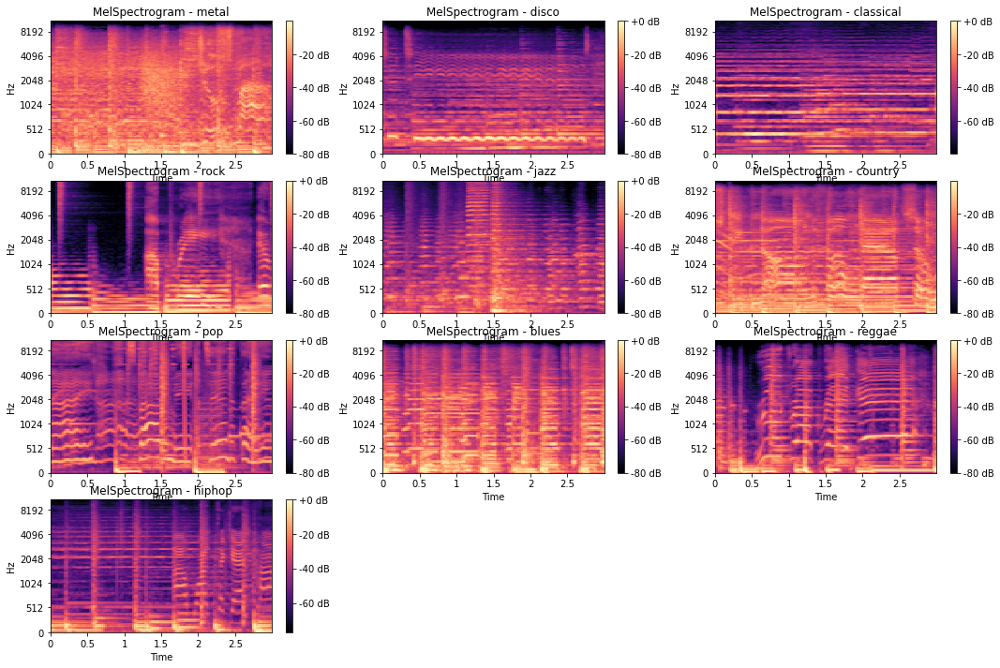

In [ ]:
fig = plt.figure(figsize=(18, 12))

for i in range(val_samples.shape[0]):
  mel_spec_dB = librosa.power_to_db(val_samples[i].squeeze()*MAX_SPEC, ref=np.max)
  # mel_spec_dB = librosa.amplitude_to_db(val_samples[i].squeeze()*MAX_SPEC, ref=np.max)
  
  plt.subplot(4, 3, i + 1)
  # plt.figure(figsize=(6, 3))
  librosa.display.specshow(mel_spec_dB, x_axis='time', y_axis='mel', sr=sample_rate)
  plt.colorbar(format='%+1.0f dB')
  plt.title(f"MelSpectrogram - {idx_to_genres[i]}")
  # plt.tight_layout()
  
plt.show()

In [ ]:
ipd.Audio(mel_to_audio(val_samples[3].squeeze()), rate=sample_rate)

In [ ]:
# Scaled Back
ipd.Audio(mel_to_audio(val_samples[3].squeeze() * MAX_SPEC), rate=sample_rate)

In [ ]:
ipd.Audio(mel_to_audio(val_samples[4].squeeze()), rate=sample_rate)

###### 3 x 3 training data grid also

In [ ]:
# create a dict of each unique entry and the associated indices
generes_train_idx = {v: np.where(y_train == v)[0].tolist()[:6] for v in np.unique(y_test)}

print(generes_train_idx)

train_samples = []

for i in range(NUM_GENERES):
  train_samples.append(X_train_scaled[int(generes_train_idx[i][0])])

# Numpy Array
train_samples = np.stack(train_samples, axis=0)

{0: [342, 343, 344, 345, 346, 347], 1: [361, 362, 363, 364, 365, 366], 2: [19, 20, 21, 22, 23, 24], 3: [513, 514, 515, 516, 517, 518], 4: [95, 96, 97, 98, 99, 100], 5: [0, 1, 2, 3, 4, 5], 6: [247, 248, 249, 250, 251, 252], 7: [133, 134, 135, 136, 137, 138], 8: [152, 153, 154, 155, 156, 157], 9: [38, 39, 40, 41, 42, 43]}


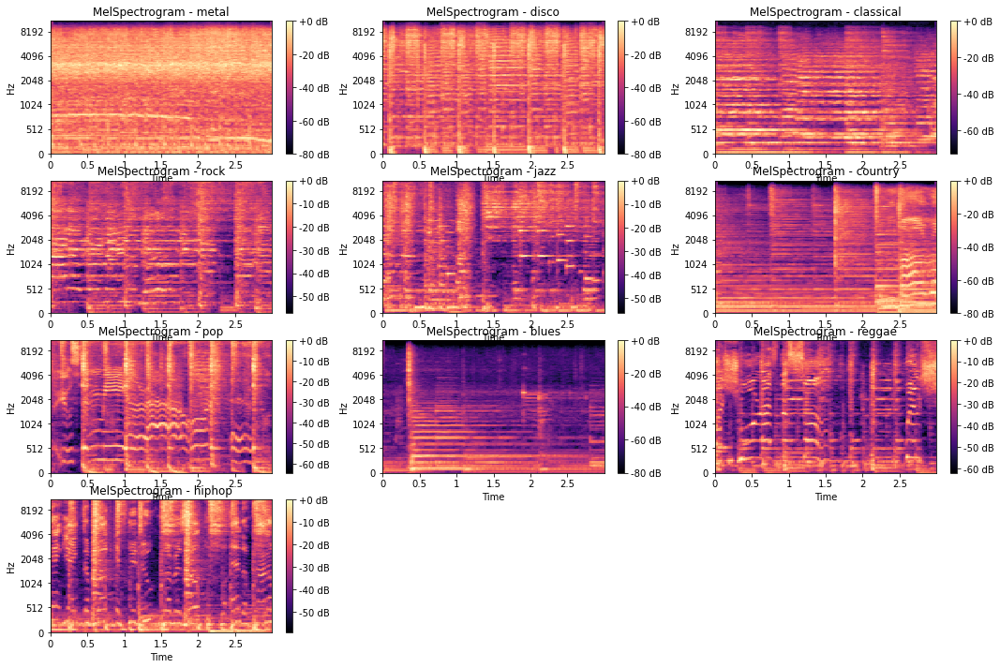

In [ ]:
fig = plt.figure(figsize=(18, 12))

for i in range(train_samples.shape[0]):
  mel_spec_recovered =train_samples[i] # train_samples[i] * (MAX_SPEC_0- MIN_SPEC_0) + MIN_SPEC_0
  mel_spec_dB = librosa.power_to_db(mel_spec_recovered.squeeze(), ref=np.max)
  # mel_spec_dB = librosa.amplitude_to_db(train_samples[i].squeeze()*MAX_SPEC, ref=np.max)
  
  plt.subplot(4, 3, i + 1)
  # plt.figure(figsize=(6, 3))
  librosa.display.specshow(mel_spec_dB, x_axis='time', y_axis='mel', sr=sample_rate)
  plt.colorbar(format='%+1.0f dB')
  plt.title(f"MelSpectrogram - {idx_to_genres[i]}")
  # plt.tight_layout()
  
plt.show()

In [ ]:
# Scaled Back
ipd.Audio(mel_to_audio((train_samples[9]* (MAX_SPEC_0- MIN_SPEC_0) + MIN_SPEC_0).squeeze()), rate=sample_rate)

In [ ]:
ipd.Audio(mel_to_audio(train_samples[9].squeeze()), rate=sample_rate)

## Model Structure

#### Vanila Variational Auto-Encoder (VAE) with Convolution

In [ ]:
class CVAE(tf.keras.Model):
  """Convolutional variational autoencoder."""

  def __init__(self, latent_dim, input_img_shape=(28, 29, 1), train_variance=TRAIN_VAR_0):
    super(CVAE, self).__init__()
    self.train_var = train_variance
    self.latent_dim = latent_dim
    self.encoder = tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=input_img_shape),
            tf.keras.layers.Conv2D(
                filters=16, kernel_size=2, strides=(2, 2), activation='relu', padding='valid'),
            tf.keras.layers.Conv2D(
                filters=32, kernel_size=3, strides=(2, 2), activation='relu', padding='same'),
            tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, strides=(2, 2), activation='relu', padding='same'),
            tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, strides=(2, 2), activation='relu', padding='same'),
            tf.keras.layers.Flatten(),
            # No activation
            tf.keras.layers.Dense(latent_dim + latent_dim),
        ]
    )

    self.decoder = tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
            tf.keras.layers.Dense(units=8*8*64, activation=tf.nn.relu),
            tf.keras.layers.Reshape(target_shape=(8, 8, 64)),
            tf.keras.layers.Conv2DTranspose(
                filters=64, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=64, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=16, kernel_size=2, strides=2, padding='valid',
                activation='relu'),
            # No activation
            # temporary trick here to reshape back to input size
            tf.keras.layers.Conv2DTranspose(
                filters=1, kernel_size=(1, 2), strides=1, padding='valid'),
        ]
    )

    ## Metrics
    self.total_loss_tracker = tf.keras.metrics.Mean(name="total_loss")
    self.reconstruction_loss_tracker = tf.keras.metrics.Mean(
            name="reconstruction_loss"
        )
    self.kl_loss_tracker = tf.keras.metrics.Mean(name="kl_loss/latent_loss")

  '''
    Properties
  '''
  @property
  def metrics(self):
      return [
          self.total_loss_tracker,
          self.reconstruction_loss_tracker,
          self.kl_loss_tracker,
      ]

  '''
    Override keras.Model functions
  '''
  '''
      Reconstruct Pass:
        x -> z -> x'
    '''
  def call(self, x):
    # print("[DEBUG] Inside Call")
    z_mean, z_log_var = self.encode(x)
    z = self.reparameterize(z_mean, z_log_var)
    reconstruction = self.decode(z)

    return reconstruction

  # @tf.function
  def train_step(self, data):
    """Executes one training step and returns the loss.

    This function computes the loss and gradients, and uses the latter to
    update the model's parameters.
    """
    # For Debug
    # tf.print("[Debug]Input Data Shape: ", data[0].shape, data[1].shape)

    with tf.GradientTape() as tape:
      loss, reconstruction_loss, kl_loss = self.compute_loss_(data[0])
      # print(f"Training Loss to Back Prop: {loss}")
    gradients = tape.gradient(loss, self.trainable_variables)
    self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))

    self.total_loss_tracker.update_state(loss)
    self.reconstruction_loss_tracker.update_state(reconstruction_loss)
    self.kl_loss_tracker.update_state(kl_loss)
    return {
        "loss": self.total_loss_tracker.result(),
        "reconstruction_loss": self.reconstruction_loss_tracker.result(),
        "kl_loss": self.kl_loss_tracker.result(),
    }


  def compute_loss_(self, x):
    '''
    @param x: the input data
    '''
    # DEBUG
    # print(f"======= [DEBUG] This is the propoer KL based Loss Computation...")
    z_mean, z_log_var = self.encode(x)
    z = self.reparameterize(z_mean, z_log_var)
    reconstruction = self.decode(z) # Non-Activated Linear output: raw logits

    ## TODO: Under MSE, is this still cross_ent?
    # mse = tf.keras.losses.MeanSquaredError(reduction=tf.keras.losses.Reduction.NONE)
    reconstruction_loss = tf.reduce_mean(
        ## TODO: loss exploding...
        # tf.reduce_sum(
        #     # mse(x, reconstruction), axis=(1, 2) # sum up all pixles and average by instance
        #     mse(x, reconstruction)/self.train_var.squeeze(), axis=(1, 2) # Scaled by training data-set 'pixel-level' variance sum up all pixles and average by instance
        # )
        # #ENT (Binary Cross Entropy) 
        ##TODO: loss is stable, but the constructed audio is almost Zero Array
        # tf.reduce_sum(
        #     tf.keras.losses.binary_crossentropy(x, reconstruction, from_logits=True), axis=(1,2)
        # )

        tf.reduce_sum(
            tf.nn.sigmoid_cross_entropy_with_logits(logits=reconstruction, labels=x), axis=(1,2,3)
        )

        # mse(y_true=x, y_pred=reconstruction)
    )
    kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
    kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
    total_loss = reconstruction_loss + kl_loss

    # print(f"Reconstruction Loss/MSE: {reconstruction_loss}, KL: {kl_loss}")

    return total_loss, reconstruction_loss, kl_loss

  '''
    Inference function, sample latent z of size 100 from N(0, I) if not provided
  '''
  @tf.function
  def sample(self, eps=None):
    if eps is None:
      eps = tf.random.normal(shape=(100, self.latent_dim))
    return self.decode(eps, apply_sigmoid=True)

  def encode(self, x):
    mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
    return mean, logvar

  def reparameterize(self, mean, logvar):
    # $$$$ sample the stochastic epsilon
    print(f"[DEBUG] Mean: {mean.shape}, LogVar shape: {logvar.shape}")
    # eps = tf.random.normal(shape=mean.shape)
    ## Get Shape when BatchSize == None
    batch = tf.shape(mean)[0]
    dim = tf.shape(mean)[1]
    eps = tf.random.normal(shape=(batch, dim))

    return eps * tf.exp(logvar * .5) + mean

  def decode(self, z, apply_sigmoid=False):
    logits = self.decoder(z)
    if apply_sigmoid:
      probs = tf.sigmoid(logits)
      return probs
    return logits


In [ ]:
input_shape = test_batch[0].shape[1:]
print(input_shape)
test_model = CVAE(LATENT_DIM, input_img_shape = input_shape,)

(128, 129, 1)


In [ ]:
## Property
test_model.metrics

In [ ]:
test_model.encoder.summary()
test_model.decoder.summary()

Model: "sequential_50"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_100 (Conv2D)         (None, 64, 64, 16)        80        
                                                                 
 conv2d_101 (Conv2D)         (None, 32, 32, 32)        4640      
                                                                 
 conv2d_102 (Conv2D)         (None, 16, 16, 64)        18496     
                                                                 
 conv2d_103 (Conv2D)         (None, 8, 8, 64)          36928     
                                                                 
 flatten_25 (Flatten)        (None, 4096)              0         
                                                                 
 dense_50 (Dense)            (None, 4)                 16388     
                                                                 
Total params: 76,532
Trainable params: 76,532
Non-tra

In [ ]:
## Encoder forward pass
test_enc_out = test_model.encode(test_batch[0])
print(test_enc_out[0].shape, test_enc_out[1].shape) # (B, L), (B, L)

(32, 2) (32, 2)


In [ ]:
## Decoder forward pass
test_z = test_model.reparameterize(test_enc_out[0], test_enc_out[1])
test_dec_out = test_model.decode(test_z)
print(test_dec_out.shape)
print(test_dec_out[0].numpy().squeeze())

[DEBUG] Mean: (32, 2), LogVar shape: (32, 2)
(32, 128, 129, 1)
[[-3.43063206e-04 -2.81347806e-04 -6.17042897e-05 ... -2.03389500e-04
  -4.92181280e-05 -3.95268253e-05]
 [ 4.92316030e-05 -6.07410737e-04 -1.64199024e-04 ... -1.93475425e-04
  -2.80566077e-04 -1.50647911e-05]
 [-1.57066126e-04 -9.81903577e-05 -5.37356245e-05 ... -1.69871390e-04
  -8.97643258e-05 -1.40860182e-04]
 ...
 [ 1.43194018e-04 -2.50959420e-04  3.22406093e-04 ...  5.31398866e-04
  -6.05205714e-04  3.04596586e-04]
 [-2.41350790e-04  4.43363351e-05 -1.63473756e-04 ...  1.38065647e-04
  -1.98130001e-04 -1.03184866e-04]
 [-5.67017923e-05 -2.55474850e-04  3.56844721e-05 ... -1.35414608e-04
  -2.23045397e-04 -8.30538920e-05]]


In [ ]:
## E2E reconstruction
test_recon = test_model(test_batch[0])
print(test_recon.shape)

[DEBUG] Mean: (32, 2), LogVar shape: (32, 2)
(32, 128, 129, 1)


In [ ]:
## DEV MSE Loss
MSE = tf.keras.losses.MeanSquaredError(reduction=tf.keras.losses.Reduction.NONE)
print(test_batch[0].shape, test_dec_out.shape)
test_loss = MSE(test_batch[0], test_dec_out)
print(test_loss.shape)
print(tf.reduce_sum(test_loss, axis=[1, 2]))
print(tf.reduce_mean(tf.reduce_sum(test_loss, axis=[1, 2]))) # (B, )
print(tf.reduce_mean(test_loss)) # ()

print(tf.reduce_sum(test_loss/TRAIN_VAR_0.squeeze(), axis=[1, 2]))

(32, 128, 129, 1) (32, 128, 129, 1)
(32, 128, 129)
tf.Tensor(
[3.9993718e+06 5.4095830e+06 1.5848955e+08 3.0360682e+07 3.2795980e+06
 9.4090290e+06 8.0509844e+05 4.8830195e+06 8.4336800e+06 8.4332290e+06
 1.1180106e+07 4.0998305e+06 2.9683276e+07 2.0983766e+07 9.4682164e+04
 2.4181634e+07 5.6794230e+06 5.7115712e+07 1.5711934e+06 1.6924985e+06
 1.7548982e+07 3.0123247e+05 3.1271132e+07 1.0957437e+05 2.4101750e+03
 1.0817645e+06 1.4760514e+06 1.7467062e+06 1.4293413e+07 3.6887332e+07
 8.1441523e+03 3.6450944e+07], shape=(32,), dtype=float32)
tf.Tensor(16592583.0, shape=(), dtype=float32)
tf.Tensor(1004.8804, shape=(), dtype=float32)
tf.Tensor(
[8.9383602e+04 1.0333986e+03 1.8263301e+04 3.9632758e+04 1.3180601e+03
 1.1241651e+04 1.2576409e+03 2.5415100e+04 3.3556348e+04 8.1410762e+03
 4.9885344e+04 2.3216794e+03 2.3341282e+03 4.1946973e+04 8.5559662e+02
 2.9497775e+04 9.7678975e+03 1.0972149e+04 3.7970620e+03 1.4897728e+03
 7.2324717e+03 9.0953949e+01 1.4107078e+03 4.2472717e+01 2.394942

In [ ]:
# TRAIN_VAR_0

#### VAE: Loss Function and Optimization/Learning

In [ ]:
import pdb


In [ ]:
## DEV MSE
# Using 'none' reduction type.
y_true = [[0., 3., 5.0], [0., 0., 3.0]]
y_pred = [[1., 1., 6.0], [1., 0., 2.0]]
# pdb.set_trace()
mse_ = tf.keras.losses.MeanSquaredError(
    reduction=tf.keras.losses.Reduction.NONE)
mse_(y_true, y_pred).numpy() # All Loss function normalyReduce last dimension

array([2.       , 0.6666667], dtype=float32)

In [ ]:
## DEV ENT $$$$$$$$$
y_true = [[0], [1]]
y_pred = [[0.6], [0.5]]

# ent = tf.keras.losses.binary_crossentropy(y_true, y_pred, from_logits=True) # if logits, then sigmoid it to (0, 1)/probability value
# print(ent)
ent = tf.keras.losses.binary_crossentropy(y_true, y_pred, from_logits=False)
print(ent) # SUM over axis==-1 by default

bce = tf.keras.losses.BinaryCrossentropy(from_logits=False, reduction=tf.keras.losses.Reduction.NONE)
print("Hard labeling: ",  bce(y_true, y_pred).numpy())

y_true_ = [[0.4], [0.8]]

# 0.4*log0.6 + 0.6log0.4
ent = tf.keras.losses.binary_crossentropy(y_true_, y_pred, from_logits=False)
print(ent) # SUM over axis==-1 by default

bce = tf.keras.losses.BinaryCrossentropy(from_logits=False, reduction=tf.keras.losses.Reduction.NONE)
print("Soft labeling: ",  bce(y_true_, y_pred).numpy())


tf.Tensor([0.9162906  0.69314694], shape=(2,), dtype=float32)
Hard labeling:  [0.9162906  0.69314694]
tf.Tensor([0.7541045  0.69314694], shape=(2,), dtype=float32)
Soft labeling:  [0.7541045  0.69314694]


In [ ]:
y_logits = [[1., 1., 6.0], [1., 0., 2.0]]
y_true = [[1., 0.6, 0.5], [0.2, 0., 0.3]]
tf.nn.sigmoid_cross_entropy_with_logits(logits=y_logits, labels=y_true)

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[0.31326172, 0.7132617 , 3.0024757 ],
       [1.1132617 , 0.6931472 , 1.526928  ]], dtype=float32)>

In [ ]:
# optimizer = tf.keras.optimizers.Adam()

'''
log(x)
x ~ N(x; u, sigma^2)
'''
def log_normal_pdf(sample, mean, logvar, raxis=1):
  log2pi = tf.math.log(2. * np.pi)
  return tf.reduce_sum(
      -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
      axis=raxis)


def compute_loss(model, x):
  mean, logvar = model.encode(x)
  z = model.reparameterize(mean, logvar)
  x_logit = model.decode(z)
  # x(x==1)logp(x'|z) 
  # note that data is already binarized
  # cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
  ## TODO: Under MSE, is this still cross_ent?
  mse = tf.keras.losses.MeanSquaredError(reduction=tf.keras.losses.Reduction.NONE)
  cross_ent = mse(y_true=x, y_pred=x_logit)
  # keep the error for each instance within batch: (B, )
  # logpx_z = -tf.reduce_sum(cross_ent, axis=[1, 2])
  # mse_loss = tf.reduce_mean(tf.reduce_sum(cross_ent, axis=[1,2]))

  # per pixel...
  mse_loss = tf.reduce_mean(cross_ent)

  # print("Batch level Reconstruction Error: ", logpx_z.shape)
  logpz = log_normal_pdf(z, 0., 0.) # log1 = 0
  logqz_x = log_normal_pdf(z, mean, logvar)
  # DEBUG
  print(f"logqz_x: {logqz_x},  logpz: {logpz}")
  print(f"avg logqz_x: {tf.reduce_mean(logqz_x)}, avg logpz: {-tf.reduce_mean(logpz)}")
  # -ELBO to minimize
  KL_approx = -tf.reduce_mean(logpz - logqz_x)
  print(f"MSE: {mse_loss}, KL: {KL_approx}")
  # return -tf.reduce_mean(logpx_z + logpz - logqz_x)
  return mse_loss + KL_approx


def compute_loss_(model, x):
  '''
  @param x: the input data
  '''
  # DEBUG
  # print(f"======= [DEBUG] This is the propoer KL based Loss Computation...")
  z_mean, z_log_var = model.encode(x)
  z = model.reparameterize(z_mean, z_log_var)
  reconstruction = model.decode(z) # Non-Activated Linear output: raw logits

  ## TODO: Under MSE, is this still cross_ent?
  mse = tf.keras.losses.MeanSquaredError(reduction=tf.keras.losses.Reduction.NONE)
  reconstruction_loss = tf.reduce_mean(
      tf.reduce_sum(
          mse(x, reconstruction), axis=(1, 2) # sum up all pixles and average by instance
      )
      # ENT
      # tf.reduce_sum(
      #     tf.keras.losses.binary_crossentropy(x, reconstruction, from_logits=True), axis=(1,2)
      # )

      # mse(y_true=x, y_pred=reconstruction)
  )
  kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
  kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
  total_loss = reconstruction_loss + kl_loss

  print(f"Reconstruction Loss/MSE: {reconstruction_loss}, KL: {kl_loss}")

  return total_loss

# @tf.function
def train_step(model, x, optimizer):
  """Executes one training step and returns the loss.

  This function computes the loss and gradients, and uses the latter to
  update the model's parameters.
  """
  with tf.GradientTape() as tape:
    loss = compute_loss_(model, x)
    # print(f"Training Loss to Back Prop: {loss}")
  gradients = tape.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(gradients, model.trainable_variables))

  return loss

In [ ]:
#### Validation between Epoches
'''
 sample latent z based on actual test data x
'''
def generate_and_save_images(model, epoch, test_sample):
  # mean, logvar = model.encode(test_sample)
  # # print('(Test Image generation) Epoch: {}, encoded mean: {}, encoded log var: {}'.format(epoch, mean, logvar))
  # z = model.reparameterize(mean, logvar) # The actual sample happens here
  # predictions = model.sample(z) # equals to directly decode here

  # Direct Reconstruction (x -> x')
  predictions = model(test_sample)
  fig = plt.figure(figsize=(18, 12))
  ret = []

  for i in range(predictions.shape[0]):
    mel_spec = predictions[i].numpy()
    # mel_spec = predictions[i].numpy() * (MAX_SPEC_0- MIN_SPEC_0) + MIN_SPEC_0
    mel_spec_dB = librosa.power_to_db(mel_spec.squeeze(), ref=np.max)
    plt.subplot(4, 3, i + 1)
    # plt.figure(figsize=(6, 3))
    # print("MEL SPEC DB: {}".format(mel_spec_dB.shape))
    if i==9:
      print("X': ", mel_spec.squeeze())
      print("MelSPEC DB: ", mel_spec_dB)
    librosa.display.specshow(mel_spec_dB, x_axis='time', y_axis='mel', sr=sample_rate)
    plt.colorbar(format='%+1.0f dB')
    plt.title(f"MelSpectrogram - {idx_to_genres[i]}")
    # plt.tight_layout()
    ret.append(predictions[i].numpy())
    
  plt.show()

  return ret

[DEBUG] Mean: (10, 2), LogVar shape: (10, 2)
X':  [[ 1.3609453e-04 -2.1184389e-04  2.8428522e-05 ...  9.7625498e-06
   3.0293694e-04 -1.5597628e-07]
 [ 1.2430565e-04  1.4528335e-05  2.3321070e-04 ... -2.6141800e-04
   2.1080081e-05  8.5637530e-06]
 [ 1.8007096e-04  2.2924818e-05  1.7934434e-04 ...  1.8816587e-05
  -1.9877937e-04  4.3540997e-05]
 ...
 [ 5.7989568e-05 -5.2918540e-04  1.8875836e-04 ...  2.9299082e-04
   1.0260713e-04 -2.9798690e-04]
 [-1.6672726e-04 -3.7330450e-04  7.4945882e-07 ...  3.4527707e-06
  -1.6863014e-04  2.4283769e-05]
 [-2.3346192e-05 -1.8966695e-05  5.7540190e-05 ...  2.1062346e-04
   3.0279584e-04 -3.8143156e-05]]
MelSPEC DB:  [[-12.9410515 -74.27946   -19.741913  ... -24.383823   -9.465935
  -74.27946  ]
 [-13.334549  -22.657299  -10.601971  ... -74.27946   -21.040737
  -24.95282  ]
 [-11.725021  -20.6764    -11.74258   ... -21.53405   -74.27946
  -17.890472 ]
 ...
 [-16.645958  -74.27946   -11.520397  ...  -9.610916  -14.167683
  -74.27946  ]
 [-74.27946  

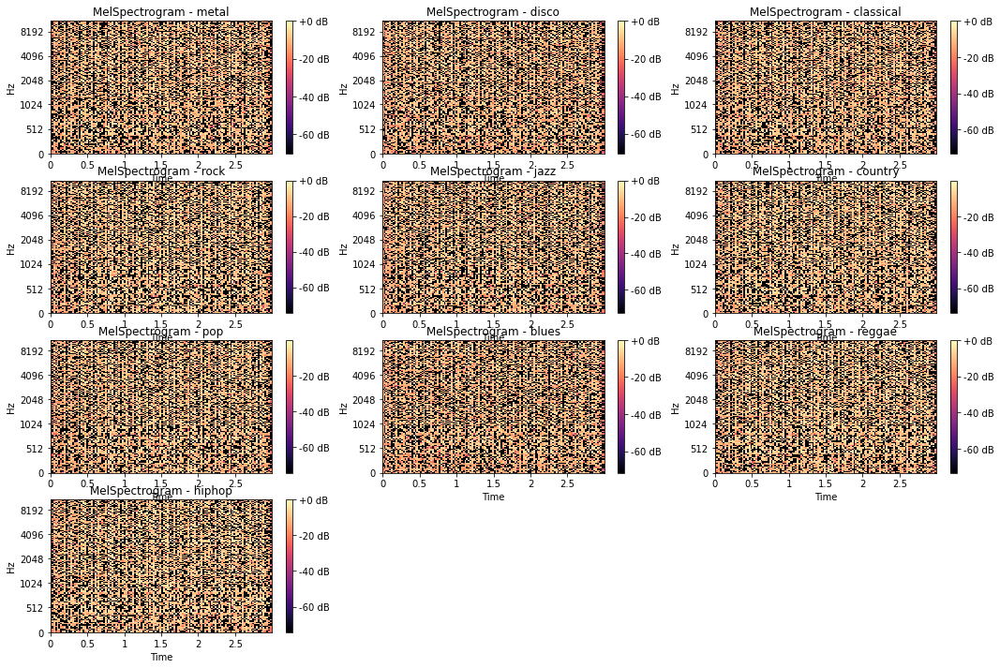

In [ ]:
_ = generate_and_save_images(test_model, 0, train_samples)

In [ ]:
del optimizer
# optimizer
del mse

NameError: ignored

## Training&&Validation Steps

In [ ]:
del vae_model

In [ ]:
# Callbacks
class VAEMonitor(tf.keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, **kwargs):
        super(VAEMonitor, self).__init__(**kwargs)

    def on_epoch_end(self, epoch, logs=None):
      if epoch % 30 == 0:
        print("[DEBUG] This is Callback Monitor: End of Epoch", epoch)
        # generate_and_save_images(self.model, epoch, val_samples)
        generate_and_save_images(self.model, epoch, train_samples)
        

In [ ]:
vae_monitor = VAEMonitor()

#### Training using 'FIT' (Suffering from Exploding Reconstruction Loss...)

(128, 129, 1)
Epoch 1/300
[DEBUG] Mean: (None, 128), LogVar shape: (None, 128)
[DEBUG] Mean: (None, 128), LogVar shape: (None, 128)
472/475 [============================>.] - ETA: 0s - loss: 2338.0488 - reconstruction_loss: 981.2811 - kl_loss: 27.9362[DEBUG] This is Callback Monitor: End of Epoch 0
[DEBUG] Mean: (10, 128), LogVar shape: (10, 128)
X':  [[-1.7951641 -2.445166  -2.603658  ... -3.6281042 -2.8958607 -1.8563099]
 [-2.0172393 -2.342785  -2.1616018 ... -3.204584  -2.9745271 -1.5160573]
 [-2.0424244 -2.3795369 -2.3278646 ... -3.0004058 -2.8109004 -2.042401 ]
 ...
 [-3.1852186 -3.323395  -3.0905476 ... -3.6900299 -3.7330735 -2.5810142]
 [-2.8128004 -3.1914191 -3.0132103 ... -3.7189553 -3.7079446 -2.6035702]
 [-2.9393256 -3.149983  -2.9593096 ... -3.74688   -3.7323544 -2.5089078]]
MelSPEC DB:  [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


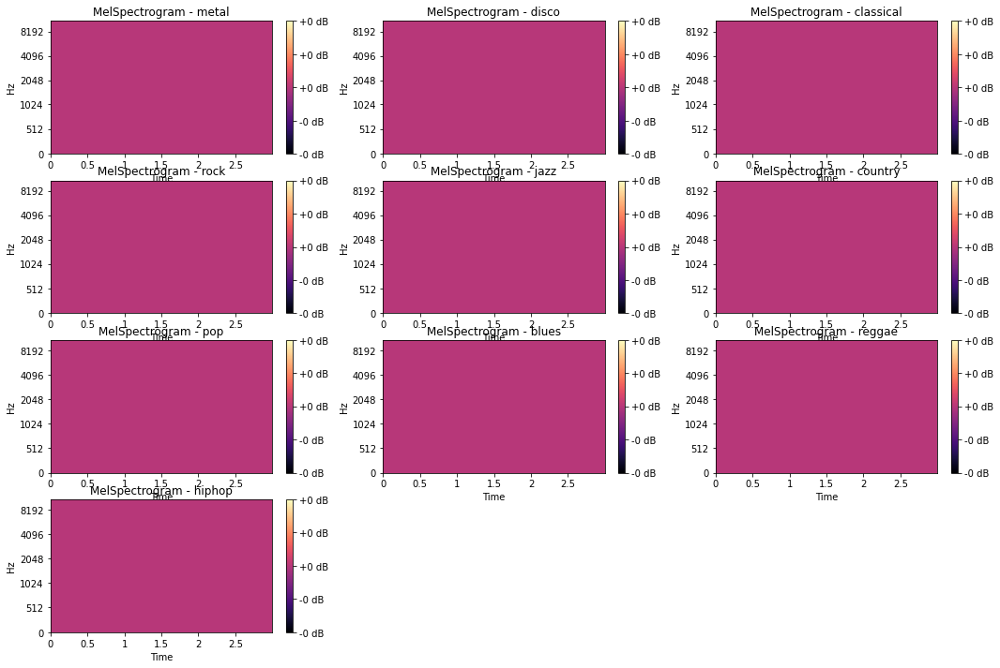

475/475 [==============================] - 10s 18ms/step - loss: 2326.7594 - reconstruction_loss: 978.1413 - kl_loss: 27.8332 - lr: 0.0010
Epoch 2/300
475/475 [==============================] - 8s 16ms/step - loss: 522.5105 - reconstruction_loss: 519.5598 - kl_loss: 7.4482 - lr: 0.0010
Epoch 3/300
475/475 [==============================] - 8s 16ms/step - loss: 523.2540 - reconstruction_loss: 511.5612 - kl_loss: 8.6523 - lr: 0.0010
Epoch 4/300
475/475 [==============================] - 8s 17ms/step - loss: 516.3198 - reconstruction_loss: 506.6327 - kl_loss: 9.0738 - lr: 0.0010
Epoch 5/300
475/475 [==============================] - 8s 17ms/step - loss: 509.6663 - reconstruction_loss: 504.3988 - kl_loss: 9.4443 - lr: 0.0010
Epoch 6/300
475/475 [==============================] - 8s 16ms/step - loss: 509.6016 - reconstruction_loss: 502.4061 - kl_loss: 9.7741 - lr: 0.0010
Epoch 7/300
475/475 [==============================] - 8s 16ms/step - loss: 507.2894 - reconstruction_loss: 500.7627 - kl

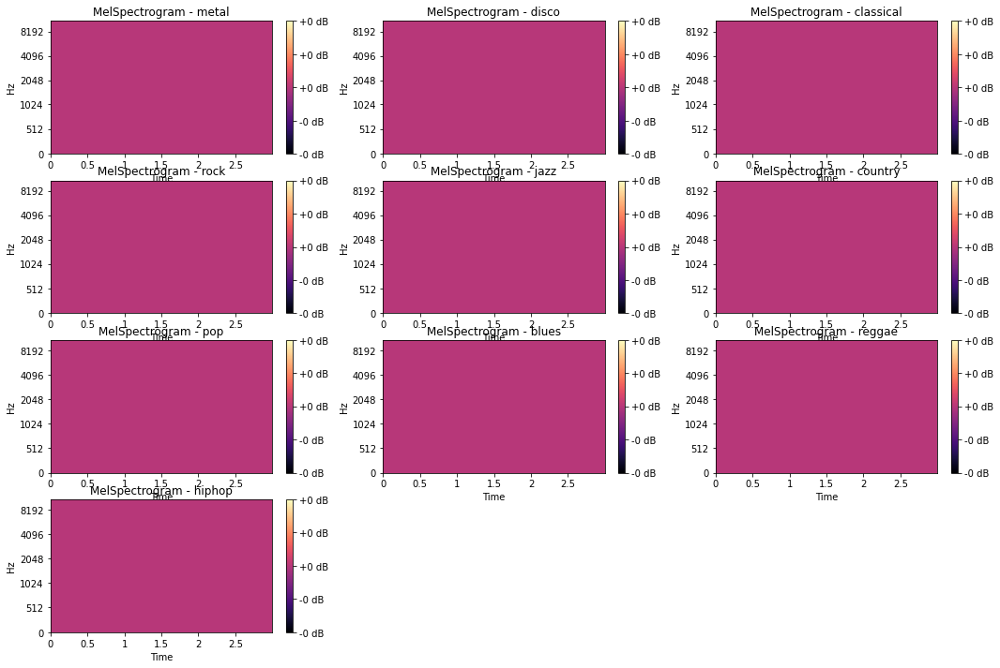

475/475 [==============================] - 9s 18ms/step - loss: 497.4267 - reconstruction_loss: 480.2146 - kl_loss: 15.7002 - lr: 0.0010
Epoch 32/300
475/475 [==============================] - 8s 16ms/step - loss: 501.7318 - reconstruction_loss: 479.5442 - kl_loss: 15.9578 - lr: 0.0010
Epoch 33/300
475/475 [==============================] - 8s 16ms/step - loss: 500.2824 - reconstruction_loss: 479.3538 - kl_loss: 16.1181 - lr: 0.0010
Epoch 34/300
475/475 [==============================] - 8s 16ms/step - loss: 495.6924 - reconstruction_loss: 479.3531 - kl_loss: 15.9361 - lr: 0.0010
Epoch 35/300
475/475 [==============================] - 8s 16ms/step - loss: 498.1527 - reconstruction_loss: 479.0580 - kl_loss: 16.2573 - lr: 0.0010
Epoch 36/300
475/475 [==============================] - 8s 16ms/step - loss: 491.9924 - reconstruction_loss: 478.9510 - kl_loss: 16.0522 - lr: 0.0010
Epoch 37/300
473/475 [============================>.] - ETA: 0s - loss: 496.1603 - reconstruction_loss: 478.5500 

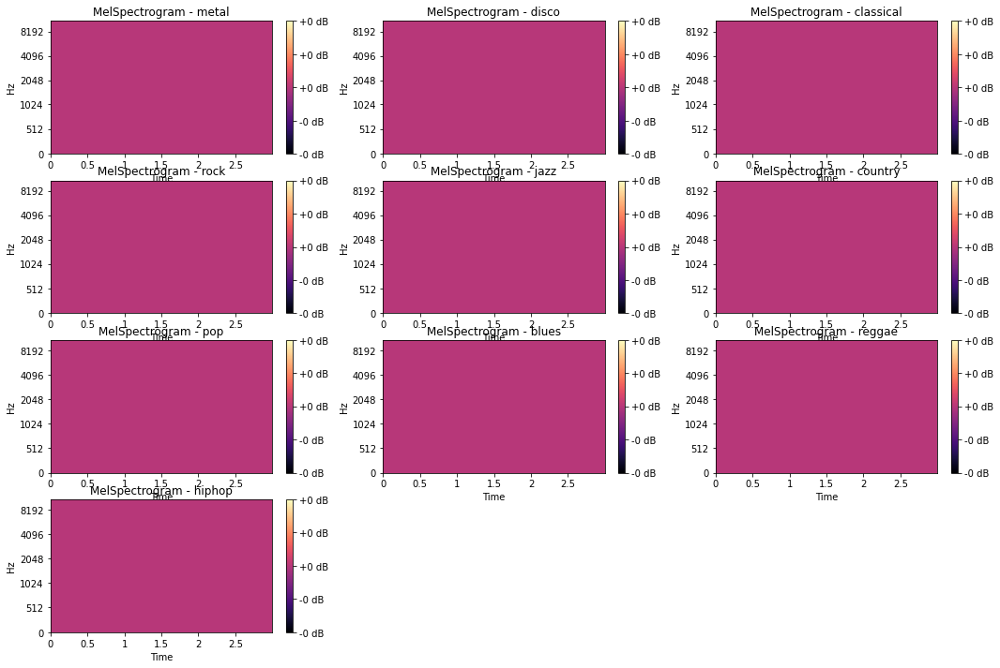


Epoch 00061: ReduceLROnPlateau reducing learning rate to 3.200000264769187e-07.
475/475 [==============================] - 9s 18ms/step - loss: 495.8386 - reconstruction_loss: 475.0426 - kl_loss: 16.7711 - lr: 1.6000e-06
Epoch 62/300
426/475 [=========================>....] - ETA: 0s - loss: 494.3580 - reconstruction_loss: 476.2193 - kl_loss: 16.8161

KeyboardInterrupt: ignored

In [ ]:
input_shape = test_batch[0].shape[1:]
print(input_shape)
vae_model = CVAE(128, input_img_shape=input_shape, train_variance=TRAIN_VAR_0*1000)

# Callback 0: Learning Rate Scheduler
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.2, patience=5, verbose=1, min_lr=0.0000001, min_delta=1.0)
vae_model.compile(optimizer=tf.keras.optimizers.Adam())
vae_model.fit(train_dataset, epochs=300, callbacks=[vae_monitor, reduce_lr])

In [ ]:
vae_model.compile(optimizer=tf.keras.optimizers.Adam(1e-4))

vae_model.fit(train_dataset, epochs=20)

Epoch 1/20
[DEBUG] Mean: (None, 128), LogVar shape: (None, 128)
[DEBUG] Mean: (None, 128), LogVar shape: (None, 128)
475/475 [==============================] - 9s 16ms/step - loss: 2727.1141 - reconstruction_loss: 2479.8652 - kl_loss: 242.6180
Epoch 2/20
475/475 [==============================] - 8s 16ms/step - loss: 2628.2432 - reconstruction_loss: 2399.4451 - kl_loss: 243.8144
Epoch 3/20
475/475 [==============================] - 8s 16ms/step - loss: 2647.1395 - reconstruction_loss: 2367.1743 - kl_loss: 247.3767
Epoch 4/20
475/475 [==============================] - 8s 16ms/step - loss: 2607.1116 - reconstruction_loss: 2346.7898 - kl_loss: 244.9326
Epoch 5/20
475/475 [==============================] - 8s 16ms/step - loss: 2582.9592 - reconstruction_loss: 2331.7488 - kl_loss: 245.4031
Epoch 6/20
475/475 [==============================] - 8s 16ms/step - loss: 2575.6500 - reconstruction_loss: 2322.7251 - kl_loss: 245.8211
Epoch 7/20
475/475 [==============================] - 8s 16ms/step

KeyboardInterrupt: ignored

[DEBUG] Mean: (10, 128), LogVar shape: (10, 128)
X':  [[-3.5984163 -3.519443  -4.4485826 ... -5.6494746 -5.5218062 -5.380985 ]
 [-3.899764  -3.4823947 -3.2709603 ... -4.60326   -4.4939036 -4.2905664]
 [-2.9431882 -2.7651598 -2.8911815 ... -3.6491168 -3.4294991 -3.4114802]
 ...
 [-5.1832037 -5.3559875 -5.070353  ... -5.2257967 -4.9784985 -5.0939555]
 [-5.114485  -5.0414433 -4.882344  ... -4.588143  -4.7409763 -4.890637 ]
 [-4.789962  -4.7761154 -4.5521903 ... -4.8179116 -5.02464   -4.9611793]]
MelSPEC DB:  [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


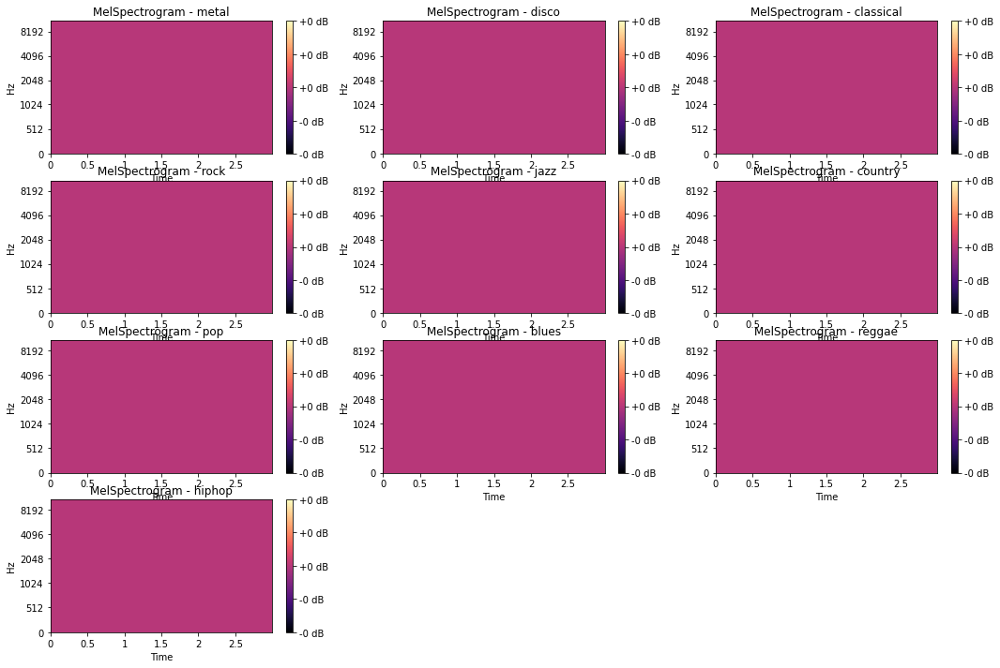

In [ ]:
## Inspect the recoverred training audio
train_mel_specs_samples = generate_and_save_images(vae_model, 0, train_samples)

In [ ]:
ipd.Audio(mel_to_audio((train_mel_specs_samples[0] * (MAX_SPEC_0-MIN_SPEC_0) + MIN_SPEC_0).squeeze()), rate=sample_rate)

In [ ]:
print(train_mel_specs_samples[0].shape)
train_loss = MSE(y_true=train_samples, y_pred=train_mel_specs_samples)
tf.reduce_sum(train_loss, axis=[-2, -1])

(128, 129, 1)


<tf.Tensor: shape=(10,), dtype=float32, numpy=
array([ 351038.6 ,  818320.06, 1650106.2 ,  468407.28,  508659.16,
        992535.1 ,  449786.03, 1212056.5 ,  672027.56,  491364.34],
      dtype=float32)>

In [ ]:
train_loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=train_samples, logits=train_mel_specs_samples)
tf.reduce_sum(train_loss, axis=[1,2,3])

<tf.Tensor: shape=(10,), dtype=float32, numpy=
array([1499.0398   ,  198.54742  ,    4.3257422,  717.16675  ,
        640.9351   ,  187.47842  ,  757.4068   ,   54.756424 ,
        293.0481   ,  875.72327  ], dtype=float32)>

In [ ]:
train_loss = tf.keras.losses.binary_crossentropy(train_samples, train_mel_specs_samples, from_logits=True)
tf.reduce_sum(train_loss, axis=[-2, -1])

<tf.Tensor: shape=(10,), dtype=float32, numpy=
array([1499.0398   ,  198.54742  ,    4.3257422,  717.16675  ,
        640.9351   ,  187.47842  ,  757.4068   ,   54.756424 ,
        293.0481   ,  875.72327  ], dtype=float32)>

In [ ]:
tf.reduce_sum(MSE(train_samples * (MAX_SPEC_0-MIN_SPEC_0) + MIN_SPEC_0, train_mel_specs_samples* (MAX_SPEC_0-MIN_SPEC_0) + MIN_SPEC_0), axis=[-2, -1])

<tf.Tensor: shape=(10,), dtype=float32, numpy=
array([8.5056730e+11, 1.5464981e+12, 3.1722798e+12, 1.1685590e+12,
       8.8901511e+11, 1.3688713e+12, 9.7908497e+11, 2.0022843e+12,
       1.4201497e+12, 7.9179160e+11], dtype=float32)>

In [ ]:
# MAX_SPEC_0-MIN_SPEC_0
# np.var(X_train, axis=0)

#### Custom Training using separate functions

In [ ]:
input_shape = test_batch[0].shape[1:]
print(input_shape)
model = CVAE(128, input_img_shape=input_shape)
model.encoder.summary()
model.decoder.summary()

(128, 129, 1)
Model: "sequential_112"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_224 (Conv2D)         (None, 64, 64, 16)        80        
                                                                 
 conv2d_225 (Conv2D)         (None, 32, 32, 32)        4640      
                                                                 
 conv2d_226 (Conv2D)         (None, 16, 16, 64)        18496     
                                                                 
 conv2d_227 (Conv2D)         (None, 8, 8, 64)          36928     
                                                                 
 flatten_56 (Flatten)        (None, 4096)              0         
                                                                 
 dense_112 (Dense)           (None, 256)               1048832   
                                                                 
Total params: 1,108,976
Trainable para

In [ ]:
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
  '''
    lr increase linearly for the first 'warmup_steps training steps, 
    then decrease it proportionaly to inverse sqr root of step num
  '''
  def __init__(self, d_model=0.045, warmup_steps=20):
    super(CustomSchedule, self).__init__()

    self.d_model = d_model
    self.d_model = tf.cast(self.d_model, tf.float32)

    self.warmup_steps = warmup_steps

  def __call__(self, step):
    arg1 = tf.math.rsqrt(step)
    arg2 = step * (self.warmup_steps ** -1.5)

    return self.d_model * tf.math.minimum(arg1, arg2)

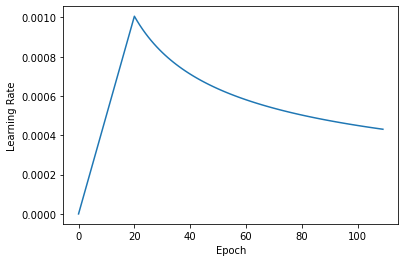

In [ ]:
# del optimizer
decay_steps = 100
lr_decayed_fn = CustomSchedule(warmup_steps=20, d_model=4.5e-3)

#tf.keras.optimizers.schedules.CosineDecay( 1e-3, decay_steps, alpha=1e-4)

plt.plot(range(decay_steps+10), lr_decayed_fn(tf.range(decay_steps+10, dtype=tf.float32)))
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')

# optimizer = tf.keras.optimizers.Adam(learning_rate=lr_decayed_fn)
optimizer = tf.keras.optimizers.Adam()

In [ ]:
val_loss_history = []
train_loss_history = []


# generate_and_save_images(model, 0, val_samples)

for epoch in range(1, 2):
  start_time = time.time()
  for (step, (train_x, train_y)) in enumerate(train_dataset):
    # print(train_x.shape, train_y.shape)
    train_loss = train_step(model, train_x, optimizer)
    train_loss_history.append(train_loss)

    if step%50 == 0:

      print('========= Epoch:{} Batch:{}, Train Loss for minimization: {}, time elapse for current epoch: {}'
        .format(epoch, step, train_loss, time.time() - start_time))
  end_time = time.time()

  # loss = tf.keras.metrics.Mean()
  # for test_x, test_y in test_dataset:
  #   loss(compute_loss_(model, test_x))
  
  # val_loss_history.append(loss.result())
  # elbo = -loss.result()
  # # display.clear_output(wait=False)
  # print('Epoch: {}, Test set ELBO: {}/Loss for minimization: {}, time elapse for current epoch: {}'
  #       .format(epoch, elbo, loss.result(), end_time - start_time))
  
  # if epoch % 5 == 0:
  #   generate_and_save_images(model, epoch, val_samples)

[DEBUG] Mean: (32, 128), LogVar shape: (32, 128)
Reconstruction Loss/MSE: 1.304649829864502, KL: 4.908069968223572e-06
========= Epoch:1 Batch:0, Train Loss for minimization: 1.3046547174453735, time elapse for current epoch: 0.4948725700378418
[DEBUG] Mean: (32, 128), LogVar shape: (32, 128)
Reconstruction Loss/MSE: 0.3874552249908447, KL: 0.00034627411514520645
[DEBUG] Mean: (32, 128), LogVar shape: (32, 128)
Reconstruction Loss/MSE: 0.4168192744255066, KL: 0.0002765841782093048
[DEBUG] Mean: (32, 128), LogVar shape: (32, 128)
Reconstruction Loss/MSE: 0.402751088142395, KL: 0.00026283226907253265
[DEBUG] Mean: (32, 128), LogVar shape: (32, 128)
Reconstruction Loss/MSE: 0.46004676818847656, KL: 0.00026550237089395523
[DEBUG] Mean: (32, 128), LogVar shape: (32, 128)
Reconstruction Loss/MSE: 0.173094242811203, KL: 0.00023140013217926025
[DEBUG] Mean: (32, 128), LogVar shape: (32, 128)
Reconstruction Loss/MSE: 0.3230692744255066, KL: 0.00017673801630735397
[DEBUG] Mean: (32, 128), LogVar

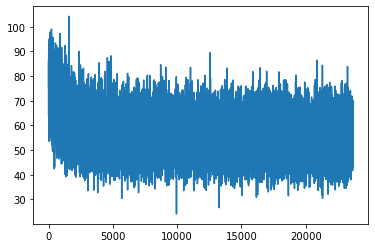

In [ ]:
# train_loss_history
plt.plot(train_loss_history[500:], label="Training Loss")


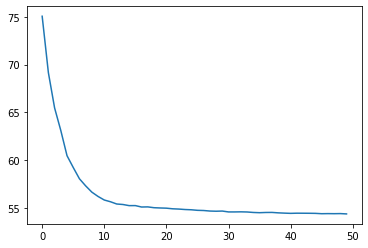

In [ ]:
plt.plot(val_loss_history, label="Training Loss")
